In [553]:
import cv2
import os
import matplotlib.pyplot as plt
import numpy as np

Note that I have also added some extra images in standard_test_images folder for purpose of image morphing. 

## Question 1

In [554]:
lena_gray_512 = cv2.imread('./standard_test_images/lena_gray_512.tif', cv2.IMREAD_GRAYSCALE)
# cv2.imshow('',lena_gray_512)

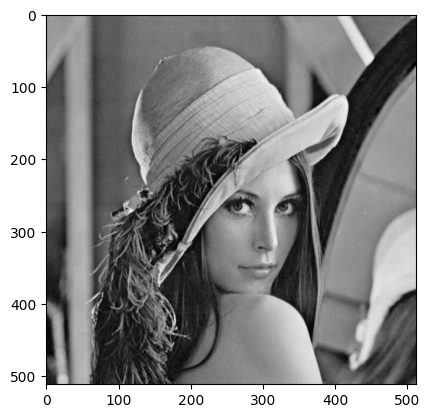

In [555]:
plt.imshow(lena_gray_512, cmap = 'gray')

#### a.) Downsample the image to 256X256

In [556]:
#downsampling from scratch. 
test = np.zeros((256,256), dtype = float)
N, M = lena_gray_512.shape
f = 2
n = 0
for i in range(256):
    m = 0
    for j in range(256):
        test[i][j] = lena_gray_512[n][m];
        m+=f
    n+=f
reduced_lena_256_a = test

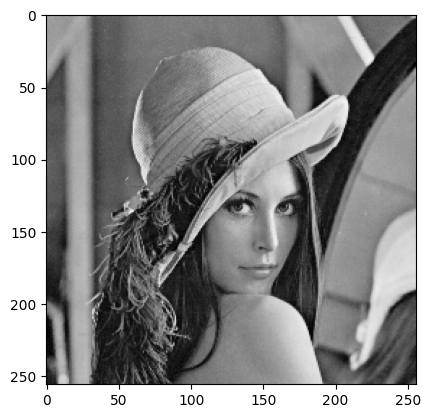

In [557]:
plt.imshow(reduced_lena_256_a,cmap = 'gray')

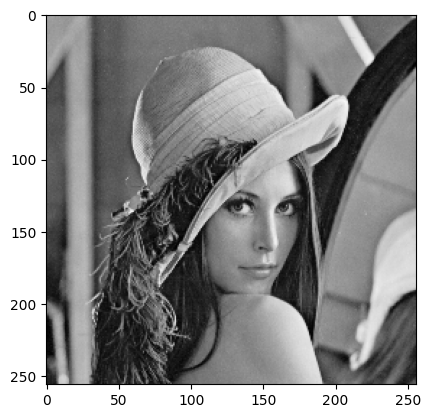

In [558]:
reduced_lena_256_b = lena_gray_512[0:512:2, 0:512:2]
plt.imshow(reduced_lena_256_b, cmap = 'gray')

#### b.) Compare images by finding PNSR values between them, also plot images showing MSE difference from same. 

In [559]:
# comparing actual image with compressed image created from scratch
actual_lena_gray_256 = cv2.imread('./standard_test_images/lena_gray_256.tif', cv2.IMREAD_GRAYSCALE)
psnr = cv2.PSNR(actual_lena_gray_256, reduced_lena_256_b)
psnr

361.20199909921956

In [560]:
# comparing actual image with compressed image created using open cv resize function. 
test_inbuilt = cv2.resize(lena_gray_512, (256,256), cv2.INTER_AREA)
cv2.PSNR(actual_lena_gray_256, test_inbuilt)

31.058421717719376

> The higher the PSNR, the better the quality of the compressed, or reconstructed image. So self written downscaling function performs better in this case

Text(0.5, 1.0, 'Resizing using opencv resize function')

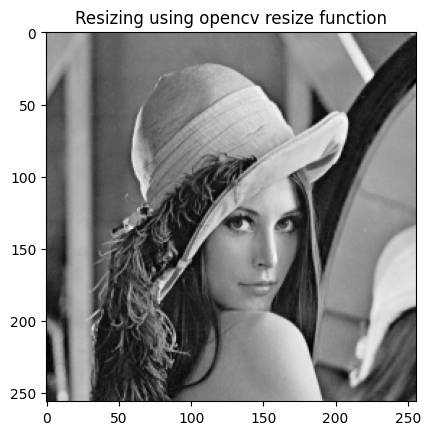

In [561]:
plt.imshow(test_inbuilt, cmap = 'gray')
plt.title("Resizing using opencv resize function")

Text(0.5, 1.0, 'Resizing by taking alternate pixel values along rows and columns')

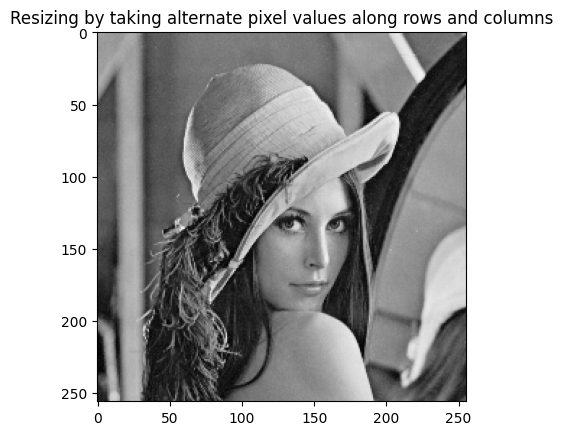

In [562]:
plt.imshow(reduced_lena_256_b, cmap = 'gray')
plt.title("Resizing by taking alternate pixel values along rows and columns")

#### Plot the image showing MSE difference between actual low resolution image and compressed image.

Text(0.5, 1.0, 'MSE between actual 256-image and compressed image created from scratch')

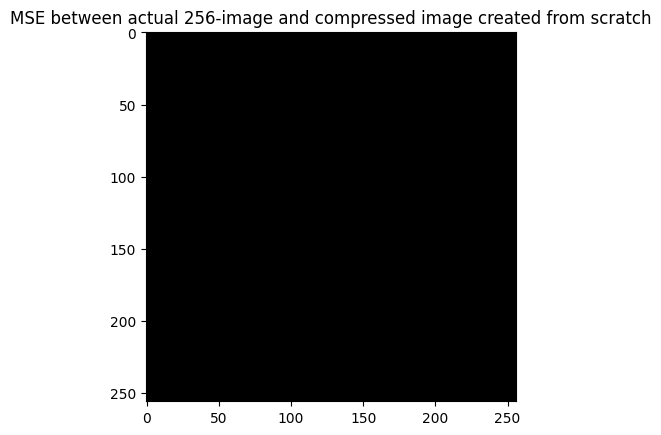

In [563]:
# reduced_lena_256 was created by taking alternate pixel values along rows and columns 
MSE = (actual_lena_gray_256 - reduced_lena_256_b)**2
plt.imshow(MSE, cmap = 'gray')
plt.title("MSE between actual 256-image and compressed image created from scratch")

Text(0.5, 1.0, 'MSE between actual 256-image and image compressed image created using inbuilt function')

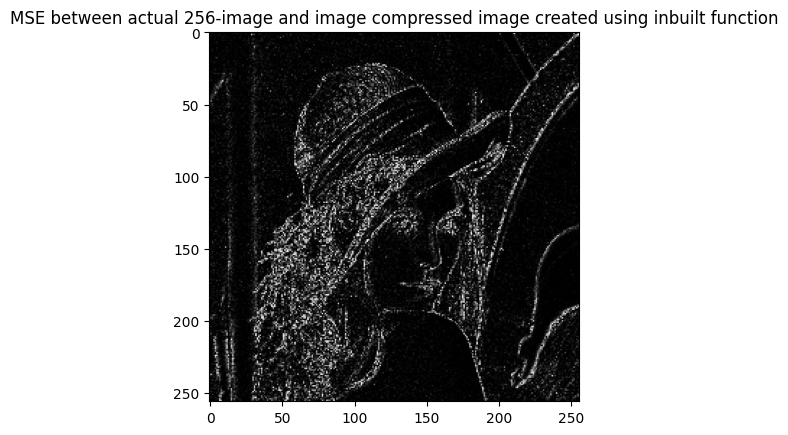

In [564]:
MSE = (actual_lena_gray_256 - test_inbuilt)**2
plt.imshow(MSE, cmap = 'gray')
plt.title("MSE between actual 256-image and image compressed image created using inbuilt function")

> one reason for better performance of hand-written code is that the 256-resolution image might have been generated using the same method

#### c.)-a Nearest Neighbour Interpolation

In [565]:
test = np.zeros((512,512)) 
test[0:512:2, 0:512:2] = reduced_lena_256_b[0:256, 0:256] 

#interpolation: slicing the new image at alternate intervals and placing original values there
test[1:512:2, 0:512:2] = reduced_lena_256_b[0:256, 0:256]
test[0:512:2, 1:512:2] = reduced_lena_256_b[0:256, 0:256]
test[1:512:2, 1:512:2] = reduced_lena_256_b[0:256, 0:256]
test

array([[162., 162., 162., ..., 171., 155., 155.],
       [162., 162., 162., ..., 171., 155., 155.],
       [162., 162., 162., ..., 171., 155., 155.],
       ...,
       [ 46.,  46.,  50., ..., 100.,  98.,  98.],
       [ 44.,  44.,  55., ..., 100., 105., 105.],
       [ 44.,  44.,  55., ..., 100., 105., 105.]])

Text(0.5, 1.0, 'Nearest Neighbor Interpolation')

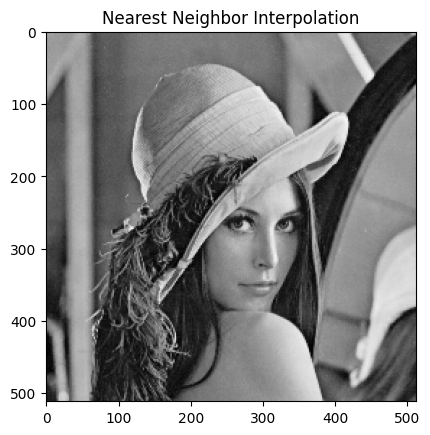

In [566]:
plt.imshow(test, cmap = 'gray')
plt.title("Nearest Neighbor Interpolation")

#### c.)-b Bilinear Interpolation

In [567]:
test = np.zeros((512,512))
test[0:512:2, 0:512:2] = reduced_lena_256_b[0:256, 0:256]
for i in range(0,511,2):
    for j in range(1,511,2):
        test[i][j] = (test[i][j-1] + test[i][j+1])/2

for i in range(1,511,2):
    for j in range(0,511,2):
        test[i][j] = (test[i-1][j] + test[i+1][j])/2
        
for i in range(1,511,2):
    for j in range(1,511,2):
        test[i][j] = (test[i-1][j-1] + test[i-1][j+1] + test[i+1][j+1] + test[i+1][j-1])/4

In [568]:
test.shape

(512, 512)

Text(0.5, 1.0, 'Bilinear Interpolation')

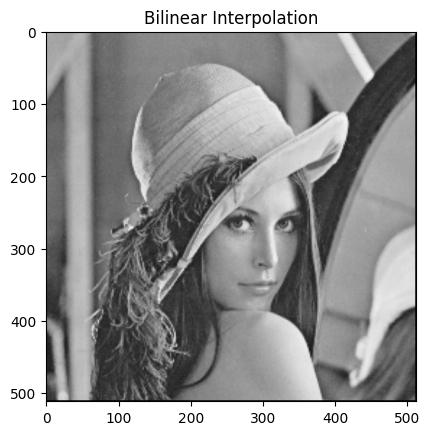

In [569]:
plt.imshow(test,cmap = 'gray')
plt.title("Bilinear Interpolation")

#### c.) -c Bicubic Interpolation

Text(0.5, 1.0, 'Bicubic Interpolation')

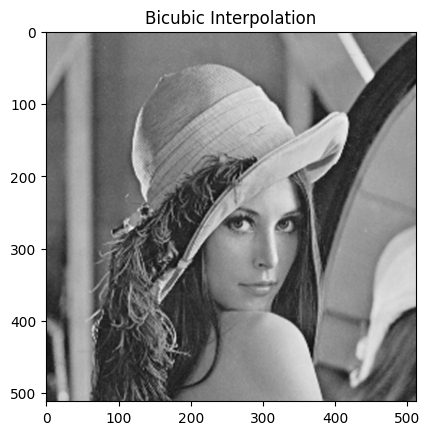

In [570]:
test = cv2.resize(reduced_lena_256_b, (512,512), interpolation = cv2.INTER_CUBIC)
plt.imshow(test, cmap = 'gray')
plt.title("Bicubic Interpolation")

## Question 2:

### Defining a function that convolutes a given kernel over given image, also taking padding and stride as input

In [571]:
def convolve2D(image, kernel, paddx = 0, paddy = 0, stride = 1):
    #     kernel = np.flipud(np.fliplr(kernel))
    xKernelShape = kernel.shape[0]
    yKernelShape = kernel.shape[1] 
    xImgShape = image.shape[0]
    yImgShape = image.shape[1] 
    
    xOutput = 1 + int((xImgShape + 2*paddx - xKernelShape)/stride)
    yOutput = 1 + int((yImgShape + 2*paddy - yKernelShape)/stride)
    
    output_image = np.zeros((xOutput, yOutput)) 
    if(paddx + paddy > 0):
        padded_img = np.zeros((xImgShape + 2*paddx, yImgShape + 2*paddy)) 
        padded_img[paddx:paddx+xImgShape , paddy: paddy+yImgShape] = image[:,:]
        image = padded_img 
        
    xImgShape = image.shape[0]
    yImgShape = image.shape[1] 
    
    # i, j should represent position of top-left corner of kernel
    for i in range(0,xImgShape-xKernelShape+1,stride):
        for j in range(0,yImgShape-yKernelShape+1,stride):
            #print(i,j)
            output_image[i][j] = (image[i:i+xKernelShape, j:j+yKernelShape]*kernel ).sum()
    
#     print(output_image) 
    plt.imshow(output_image, cmap = 'gray')
    return output_image


# def convolve2D(image, kernel, padding = 0, stride = 1):
#     #     kernel = np.flipud(np.fliplr(kernel))
#     xKernelShape = kernel.shape[0]
#     yKernelShape = kernel.shape[1] 
#     xImgShape = image.shape[0]
#     yImgShape = image.shape[1] 
    
#     xOutput = 1 + int((xImgShape + 2*padding - xKernelShape)/stride)
#     yOutput = 1 + int((yImgShape + 2*padding - yKernelShape)/stride)
    
#     output_image = np.zeros((xOutput, yOutput)) 
#     if(padding!=0):
#         padded_img = np.zeros((xImgShape + 2*padding, yImgShape + 2*padding)) 
#         padded_img[padding:padding+xImgShape , padding: padding+yImgShape] = image[:,:]
#         image = padded_img 
        
#     xImgShape = image.shape[0]
#     yImgShape = image.shape[1] 
    
#     # i, j should represent position of top-left corner of kernel
#     for i in range(0,xImgShape-xKernelShape+1,stride):
#         for j in range(0,yImgShape-yKernelShape+1,stride):
#             #print(i,j)
#             output_image[i][j] = (image[i:i+xKernelShape, j:j+yKernelShape]*kernel ).sum()
    
# #     print(output_image) 
#     plt.imshow(output_image, cmap = 'gray')
#     return output_image

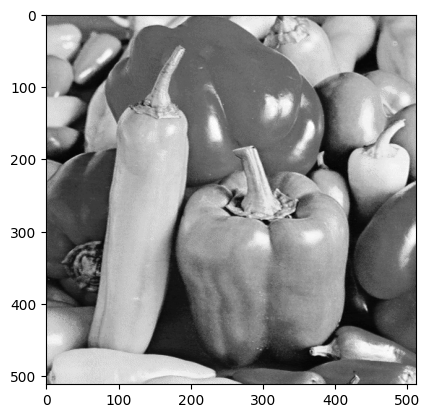

In [572]:
image = cv2.imread('./standard_test_images/peppers_gray.tif', cv2.IMREAD_GRAYSCALE)
plt.imshow(image, cmap = 'gray')

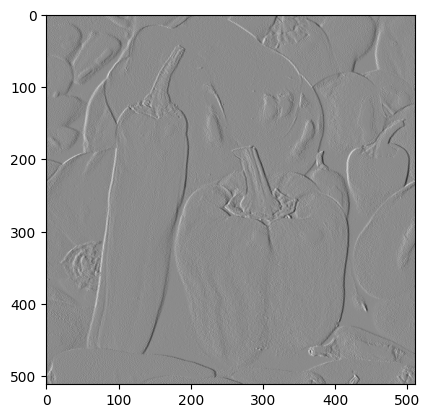

In [573]:
kernel = np.array([[-1,1]])
out1 = convolve2D(image, kernel, stride = 1)

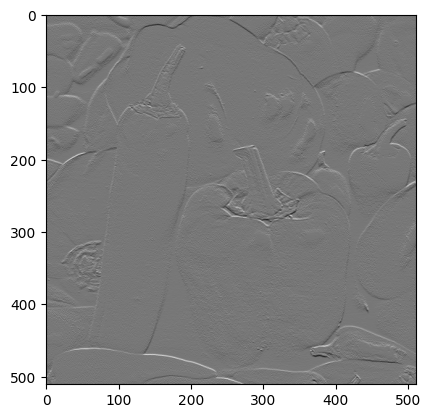

In [574]:
kernel = np.array([[-1],[1]])
out2 = convolve2D(image, kernel, stride = 1)

#### c. Gradient image magnitude

In [575]:
# removing one row and one column for uniform shapes
out3 = np.sqrt((out1[:511,:])**2 + (out2[:,:511])**2)
out3.shape

(511, 511)

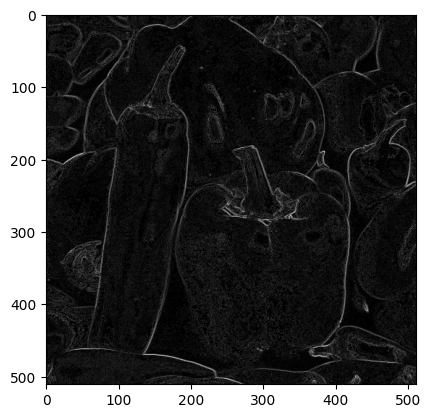

In [576]:
plt.imshow(out3, cmap = 'gray')

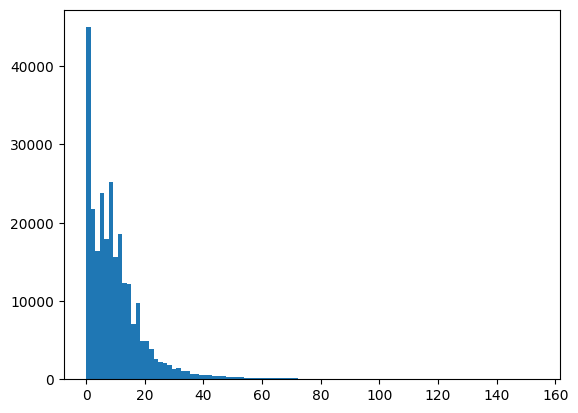

In [577]:
_ = plt.hist(out3.ravel(), bins = 100)

we can try threshold values like 10, 20, 30, 40

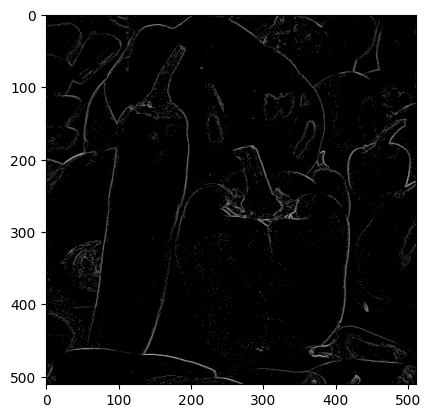

In [578]:
thres = 25
temp = copy.deepcopy(out3)
bmask = out3<thres 
temp[bmask] = 0 
plt.imshow(temp, cmap = 'gray')

#### Edge map computed using second order derivative: 

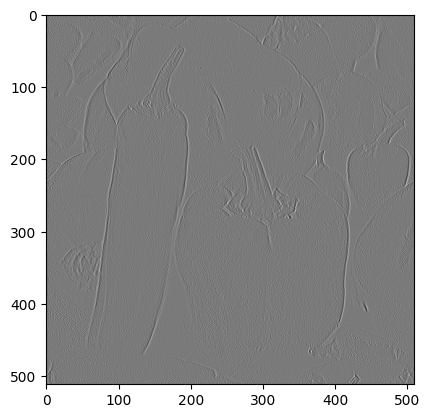

In [579]:
kernel = np.array([[1,-2,1]])
out4 = convolve2D(image, kernel, stride = 1)
# but this is second order derviative along x axis only.

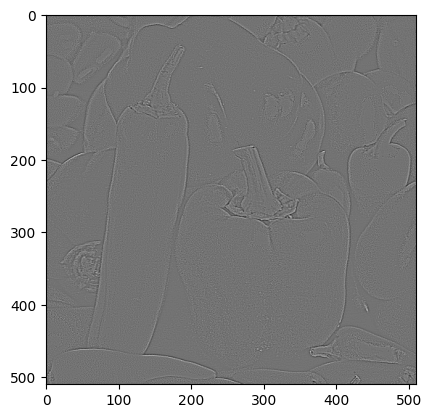

In [580]:
kernel = np.array([[-1,-1,-1],[-1,8,-1],[-1,-1,-1]])
out5 = convolve2D(image, kernel, stride = 1)

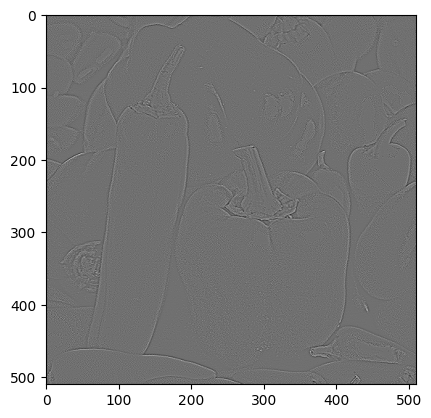

In [581]:
kernel = np.array([[0,-1,0],[-1,4,-1],[0,-1,0]])
out5 = convolve2D(image, kernel, stride = 1)

#### Edge map using LoG

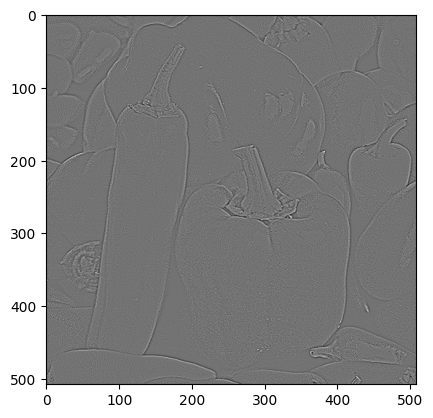

In [582]:
kernel = np.array(
    [
        [0,0,-1,0,0],
        [0,-1,-2,-1,0],
        [-1,-2,16,-2,-1],
        [0,-1,-2,-1,0],
        [0,0,-1,0,0],
    ]
)
out6 = convolve2D(image, kernel, stride = 1)

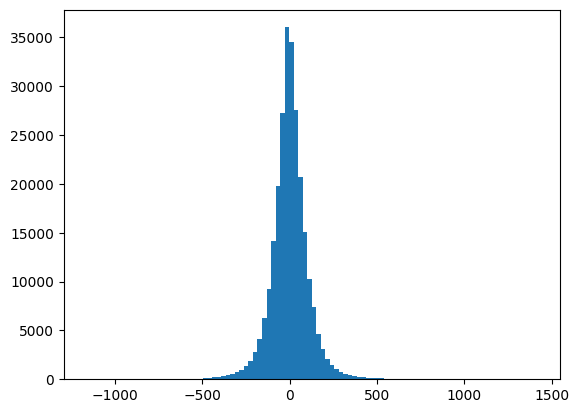

In [583]:
_ = plt.hist(out6.ravel(), bins = 100)

Applying Gaussian and Laplacian one after another

In [584]:

# Apply Gaussian Blur
blur = cv2.GaussianBlur(image,(3,3),0)

# Apply Laplacian operator in some higher datatype
laplacian = cv2.Laplacian(blur,cv2.CV_64F)

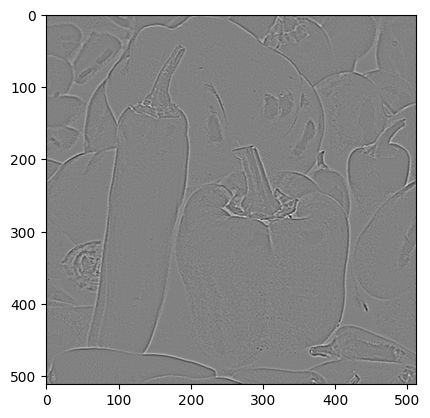

In [585]:
plt.imshow(laplacian, cmap = 'gray')

In [586]:
def apply_zero_crossings(image):
    N_x = image.shape[0]
    N_y = image.shape[1]
    output = np.zeros(image.shape)
    for i in range(1, N_x-1): 
        for j in range(1, N_y-1):
            nbrs = []
            for ii in [-1,0,1]: 
                for jj in [-1,0,1]: 
                    if(ii==0 and jj==0):continue
                    else: nbrs.append(image[i+ii][j+jj]) 
            
            M = max(nbrs)
            m = min(nbrs)
            count_pos = 0
            count_neg = 0 
            for nbr in nbrs: 
                if(nbr>0):count_pos+=1
                elif(nbr<0):count_neg+=1
            
            potential_grad = ((count_pos>0) and (count_neg>0) )
            if(potential_grad):
                if(image[i][j]<0):
                    output[i][j] = np.abs(image[i][j]) + M 
                elif(image[i][j]>0):
                    output[i][j] = np.abs(m) + image[i][j] 
    OUTPUT = (output/output.max())*255
    return OUTPUT

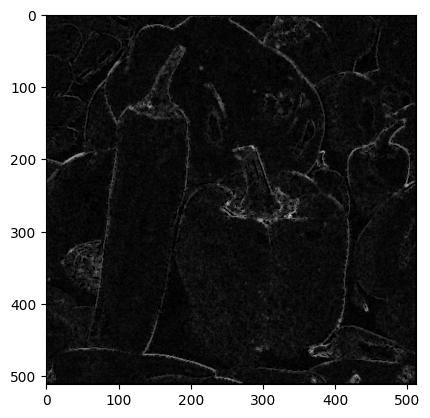

In [587]:
inp = copy.deepcopy(laplacian)
output = apply_zero_crossings(inp)
plt.imshow(output, cmap = 'gray')
# output

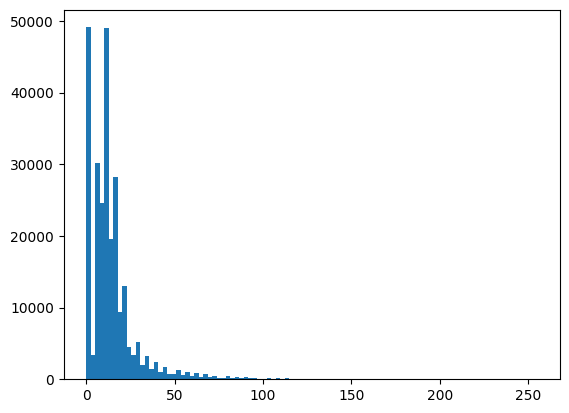

In [588]:
_ =plt.hist(output.ravel(), bins = 100)

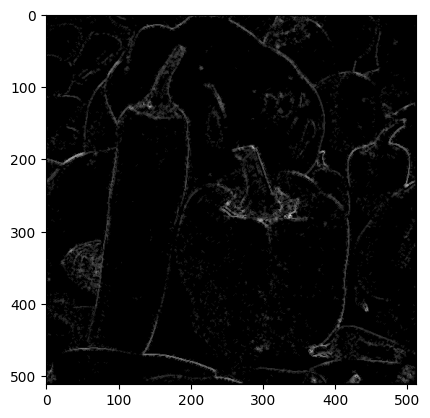

In [589]:
thres = 25
temp = copy.deepcopy(output)
bmask = output<thres 
temp[bmask] = 0 
plt.imshow(temp, cmap = 'gray')

Text(0.5, 1.0, 'Binary image generated using canny edge detector')

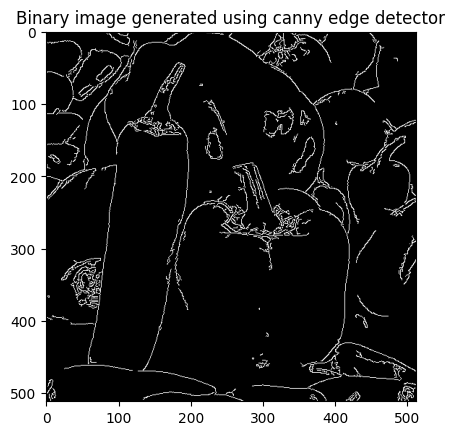

In [590]:
canny = cv2.Canny(image, 100,200)
plt.imshow(canny, cmap = 'gray')
plt.title("Binary image generated using canny edge detector")

>---------------------------------------------------------------------------
End of Question 2

## Question 3: 

A hybrid image is the sum of a low-pass filtered version of one image and a high pass filtered version of another image.  
To obtain a low pass image: Using Gaussian Kernel.  
To obtain a high pass image: Image convolved with Laplacian Filter + Original Image. 

(225, 225)


Text(0.5, 1.0, 'original image 1')

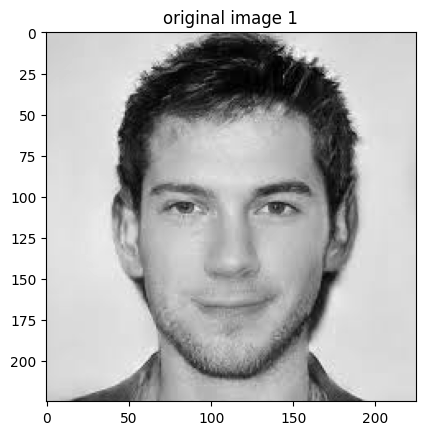

In [591]:
# loading images: 
img1 = cv2.imread("./standard_test_images/vansh1.jpg")
img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
# img1 = cv2.resize(img1, (225,225))
print(img1.shape)
plt.imshow(img1, cmap = 'gray')
plt.title("original image 1")

Text(0.5, 1.0, 'original image 2')

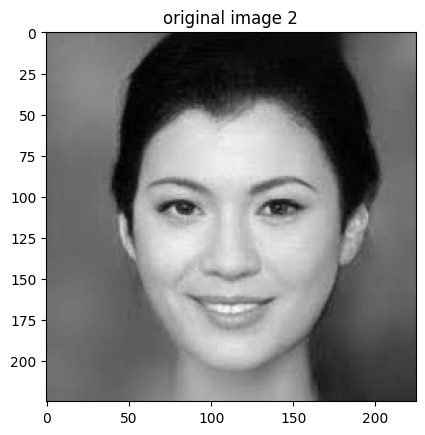

In [592]:
img2 = cv2.imread("./standard_test_images/she-vansh2.jpg")
img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)
plt.imshow(img2, cmap = 'gray')
plt.title("original image 2")

Text(0.5, 1.0, 'filtering using high pass filter (Laplacian Filter)')

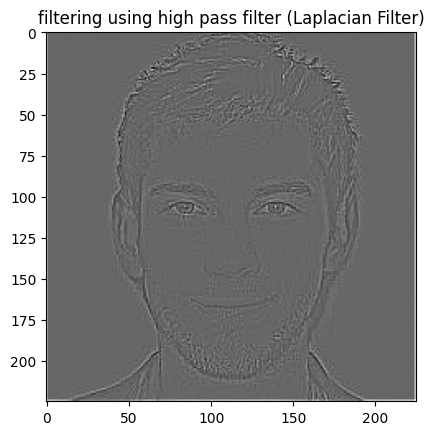

In [593]:
# taking finer (high frequency) features of man and low frequency features of raccoon: 
kernel = np.array([[-1,-1,-1],[-1,8,-1],[-1,-1,-1]])
high_pass = convolve2D(img1, kernel, paddx = 1, paddy = 1)
plt.imshow(high_pass, cmap = 'gray')
plt.title("filtering using high pass filter (Laplacian Filter)")

### Obtaining low frequency components by using a low pass filter then subtracting the low frequency components from actual image to get high_frequency components

In [594]:
# varying sigma from 1 - 10
# varying kernel size from 3 to 9
sigma = 7
ksize = (9,9)

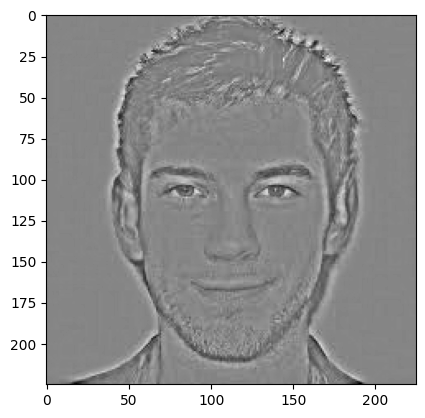

In [595]:
# low_frequency_components = cv2.GaussianBlur(img1, ksize = (9,9), sigmaX = 10, sigmaY = 10)
low_frequency_components = cv2.GaussianBlur(img1, ksize = ksize, sigmaX = sigma, sigmaY = sigma)
high_pass = img1.astype('float') - low_frequency_components 
plt.imshow(high_pass, cmap = 'gray')

We can see that the second method of blurring is looking more effective in terms of features identified.

Text(0.5, 1.0, 'Keeping a high value of kernel size and sigma is necessary if we want to observe the duality')

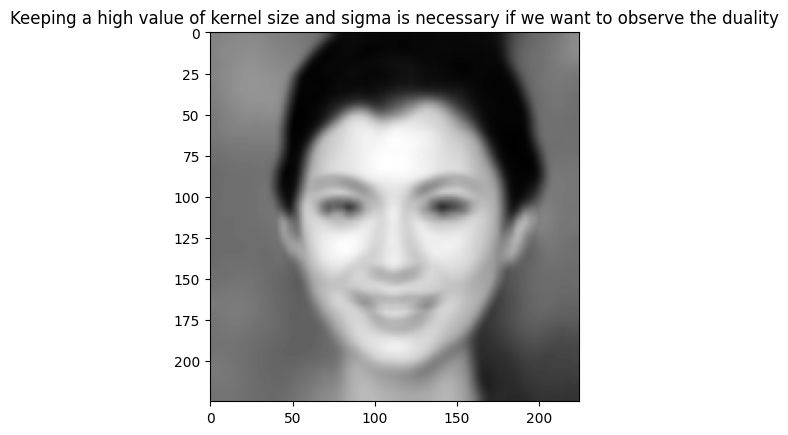

In [596]:
# taking low frequency features from raccoon> 
# low_pass = cv2.GaussianBlur(img2, ksize = (9,9), sigmaX = 10, sigmaY = 10) 
low_pass = cv2.GaussianBlur(img2, ksize = ksize, sigmaX = sigma, sigmaY = sigma)
plt.imshow(low_pass, cmap = 'gray')
plt.title("Keeping a high value of kernel size and sigma is necessary if we want to observe the duality")

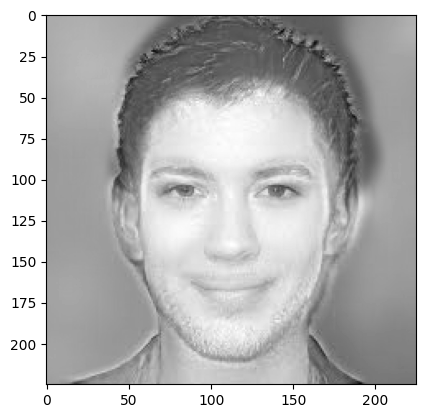

In [597]:
# Low pass image: 
morphed = high_pass + low_pass
plt.imshow(morphed, cmap = 'gray')

Here we can see the man and the woman clearly based on the viewing distance. 

#### 5.) Doing the same mixing in frequency domain

Testing blurring operation using fourier transform on a sample image

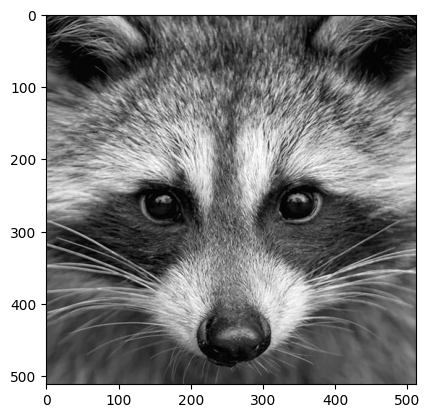

In [598]:
sample = cv2.imread("./standard_test_images/raccoon.jpg")
sample = cv2.cvtColor(sample, cv2.COLOR_BGR2GRAY)
plt.imshow(sample, cmap = 'gray')

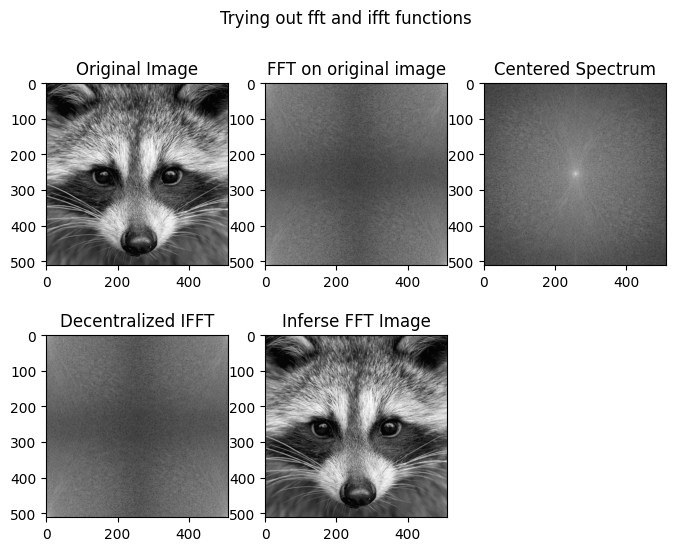

In [599]:
plt.figure(figsize=(8, 6), constrained_layout=False)

img_fft = np.fft.fft2(sample)
img_fftshift = np.fft.fftshift(img_fft)
img_ifftshift = np.fft.ifftshift(img_fftshift)
img_ifft = np.fft.ifft2(img_ifftshift)

plt.subplot(231), plt.imshow(sample, "gray"), plt.title("Original Image")
plt.subplot(232), plt.imshow(np.log(1+np.abs(img_fft)), "gray"), plt.title("FFT on original image")
plt.subplot(233), plt.imshow(np.log(1+np.abs(img_fftshift)), "gray"), plt.title("Centered Spectrum")
plt.subplot(234), plt.imshow(np.log(1+np.abs(img_ifftshift)), "gray"), plt.title("Decentralized IFFT")
plt.subplot(235), plt.imshow(np.abs(img_ifft), "gray"), plt.title("Inferse FFT Image")

plt.suptitle("Trying out fft and ifft functions")
plt.show()

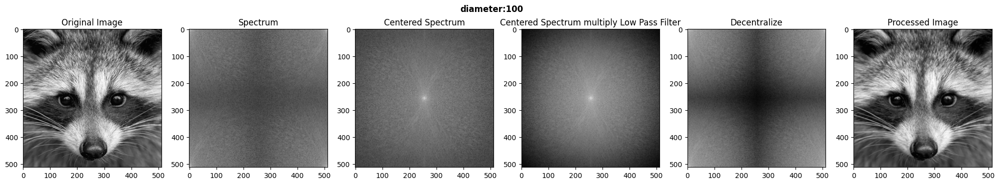

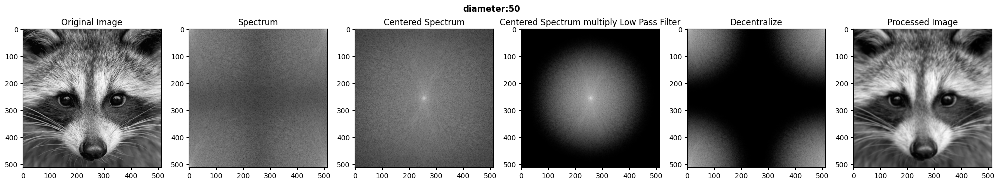

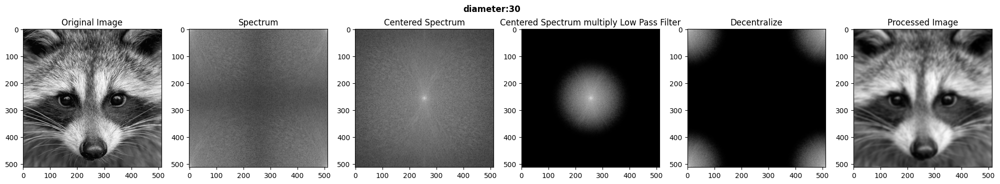

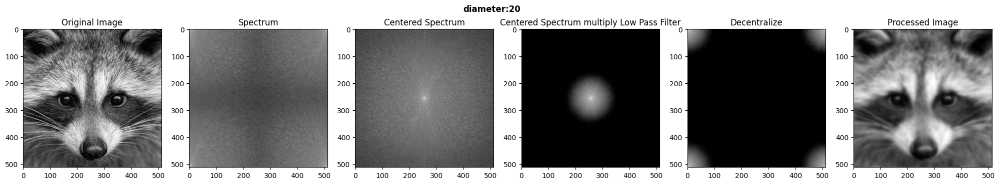

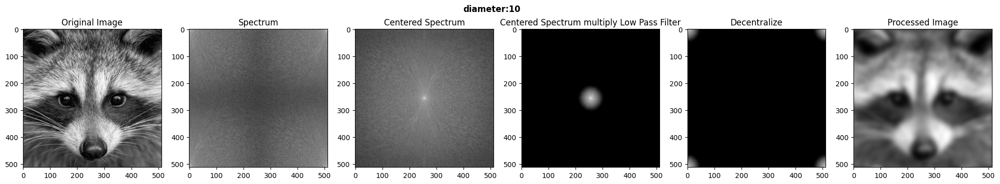

In [600]:
def eucledian_distance(point1,point2):
    return np.sqrt((point1[0]-point2[0])**2 + (point1[1]-point2[1])**2)

def generate_gaussian_filter(diameter,filterShape):
    base = np.zeros(filterShape[:2])
    rows, cols = filterShape[:2]
    center = (rows/2,cols/2)
    for x in range(cols):
        for y in range(rows):
            base[y,x] = np.exp(((-eucledian_distance((y,x),center)**2)/(2*(diameter**2))))
    return base

def gaussian_blur_with_diameter(diameter, image, show = True):
    img = image
    original = np.fft.fft2(img)
    center = np.fft.fftshift(original)
    LowPassCenter = center * generate_gaussian_filter(diameter,img.shape)
    LowPass = np.fft.ifftshift(LowPassCenter)
    inverse_LowPass = np.fft.ifft2(LowPass)
    
    if(show):
        plt.figure(figsize=(25, 5), constrained_layout=False)
        plt.subplot(161), plt.imshow(img, "gray"), plt.title("Original Image")
        plt.subplot(162), plt.imshow(np.log(1+np.abs(original)), "gray"), plt.title("Spectrum")
        plt.subplot(163), plt.imshow(np.log(1+np.abs(center)), "gray"), plt.title("Centered Spectrum")
        plt.subplot(164), plt.imshow(np.log(1+np.abs(LowPassCenter)), "gray"), plt.title("Centered Spectrum multiply Low Pass Filter")
        plt.subplot(165), plt.imshow(np.log(1+np.abs(LowPass)), "gray"), plt.title("Decentralize")
        plt.subplot(166), plt.imshow(np.abs(inverse_LowPass), "gray"), plt.title("Processed Image")

        plt.suptitle("diameter:"+str(diameter),fontweight="bold")
        plt.subplots_adjust(top=1.1)
        plt.show()
    return np.abs(inverse_LowPass)
    
for sigma in [100,50,30,20,10]:
    gaussian_blur_with_diameter(sigma, sample)

In [601]:
img1 = cv2.imread("./standard_test_images/vansh1.jpg")
img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
img2 = cv2.imread("./standard_test_images/she-vansh2.jpg")
img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)

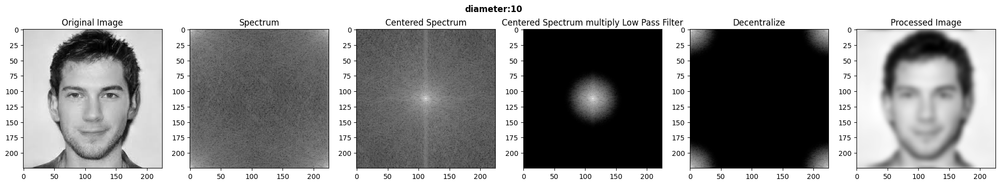

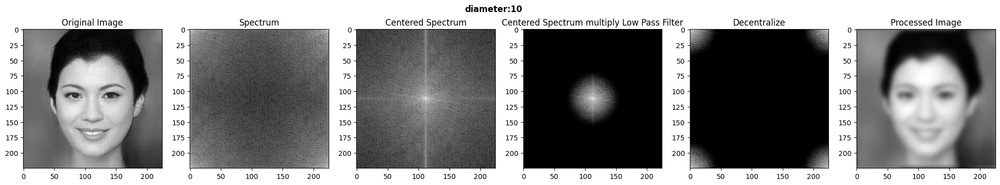

In [602]:
low_pass_img1 = gaussian_blur_with_diameter(10,img1)
low_pass_img2 = gaussian_blur_with_diameter(10,img2)

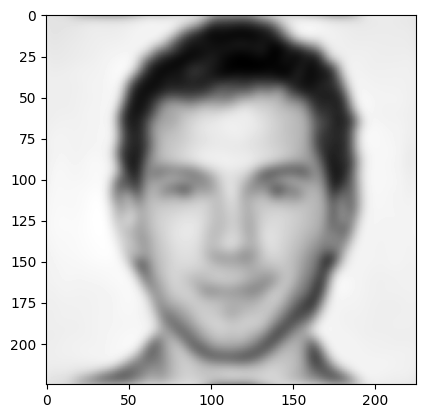

In [603]:
plt.imshow(low_pass_img1, cmap = 'gray')

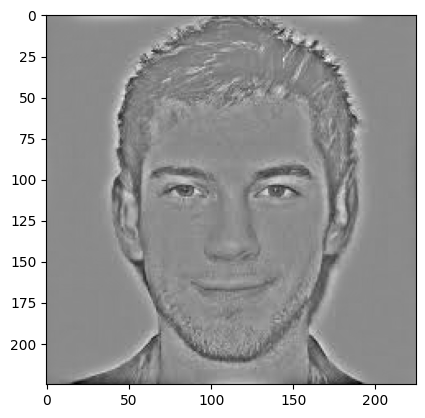

In [604]:
high_pass_img1 = img1.astype('float') - low_pass_img1.astype('float')
plt.imshow(high_pass_img1, cmap = 'gray')

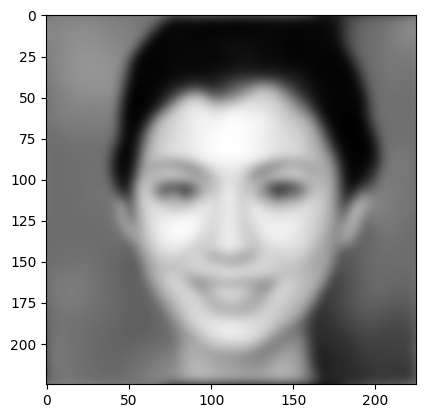

In [605]:
plt.imshow(low_pass_img2, cmap = 'gray')

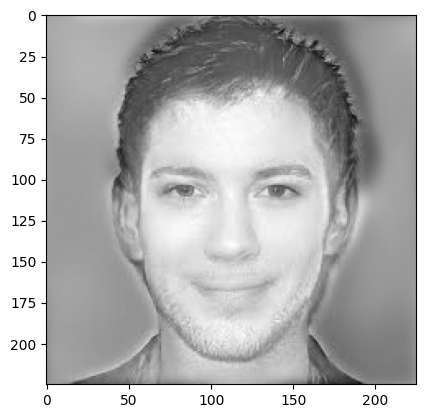

In [606]:
morphed_image2 = cv2.add(high_pass_img1, low_pass_img2)
plt.imshow(morphed_image2, cmap = 'gray')

#### Part 6. Morphing on colored images in frequency domain. 

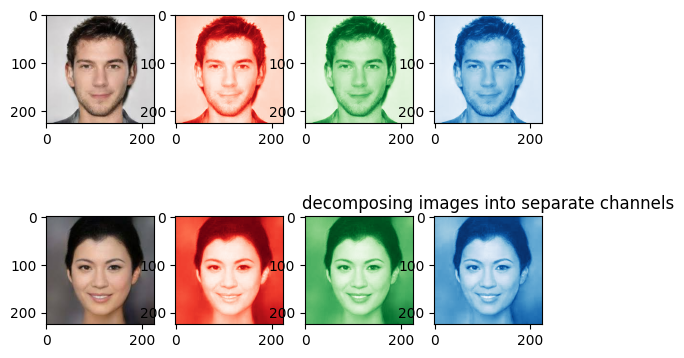

In [607]:
color_image1 = cv2.imread("./standard_test_images/woman1.jpg")
color_image1 = cv2.imread("./standard_test_images/bald_man.jpg")
color_image1 = cv2.imread("./standard_test_images/vansh1.jpg")

color_image1 = cv2.cvtColor(color_image1, cv2.COLOR_BGR2RGB)
plt.subplot(241), plt.imshow(color_image1)

color_image2 = cv2.imread("./standard_test_images/she-vansh1.jpg")
color_image2 = cv2.imread("./standard_test_images/raccoon.jpg")
color_image2 = cv2.imread("./standard_test_images/she-vansh2.jpg")
color_image2 = cv2.cvtColor(color_image2, cv2.COLOR_BGR2RGB) 
plt.subplot(245), plt.imshow(color_image2)

color_image1r, color_image1g, color_image1b = cv2.split(color_image1)
color_image2r, color_image2g, color_image2b = cv2.split(color_image2)
plt.subplot(242), plt.imshow(color_image1r, cmap = 'Reds_r')
plt.subplot(243), plt.imshow(color_image1g, cmap = 'Greens_r')
plt.subplot(244), plt.imshow(color_image1b, cmap = 'Blues_r')

plt.subplot(246), plt.imshow(color_image2r, cmap = 'Reds_r')
plt.subplot(247), plt.imshow(color_image2g, cmap = 'Greens_r')
plt.subplot(248), plt.imshow(color_image2b, cmap = 'Blues_r')

plt.title("decomposing images into separate channels")
plt.show()

In [608]:
def morph2D(image1, image2, diameter = 10):
    low_pass_image1 = gaussian_blur_with_diameter(diameter, image1, show = False) 
    low_pass_image2 = gaussian_blur_with_diameter(diameter, image2, show = False)
    high_pass_image1 = image1.astype('float') - low_pass_image1.astype('float')
    morphed_image = high_pass_image1.astype('float') + low_pass_image2.astype('float')
    morphed_image = ((morphed_image-morphed_image.min())/(morphed_image.max()-morphed_image.min()))*255
    return morphed_image.astype('int') 

In [609]:
morph_red = morph2D(color_image1r, color_image2r)
morph_green = morph2D(color_image1g, color_image2g)
morph_blue = morph2D(color_image1b, color_image2b)

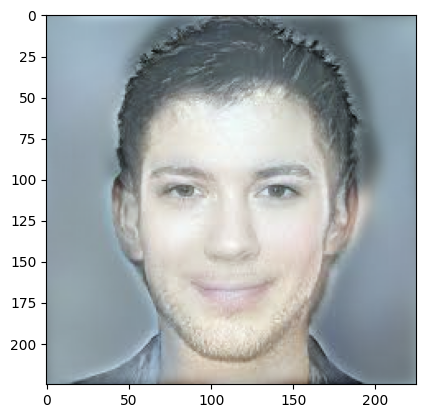

In [610]:
merged = cv2.merge([morph_red, morph_green, morph_blue])
# plt.imshow(merged)
plt.imshow(merged)

# Trials on other in-built functions
#### Prewitt

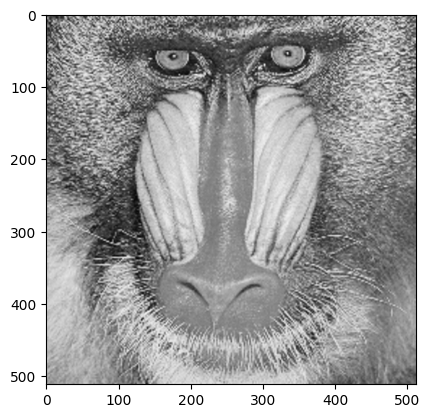

In [611]:
pepp = cv2.imread('./standard_test_images/mandril_gray.tif', cv2.IMREAD_GRAYSCALE)
plt.imshow(pepp, cmap = 'gray')

Text(0.5, 1.0, 'Vertical edges with prewitt')

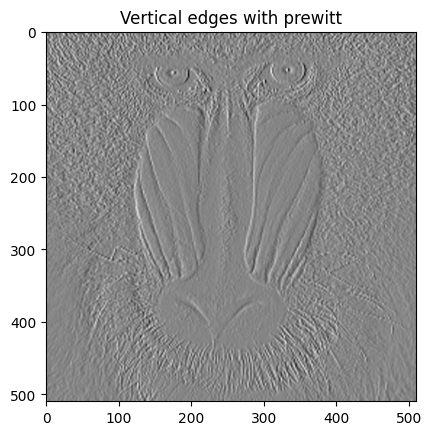

In [612]:
kernel = np.array([[-1,0,1],[-1,0,1],[-1,0,1]])
prewitt_ve = convolve2D(pepp, kernel, stride = 1)
plt.imshow(prewitt_ve, cmap = 'gray')
plt.title("Vertical edges with prewitt")

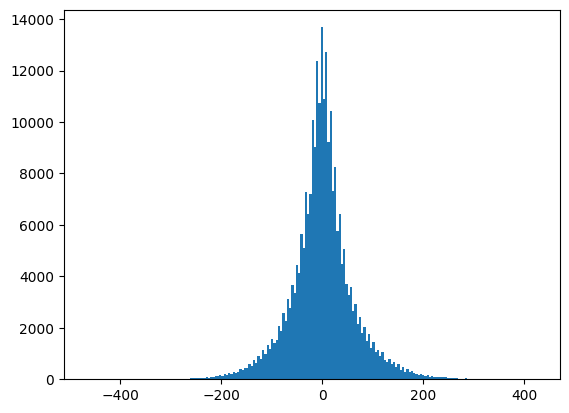

In [613]:
hist = plt.hist(prewitt_ve.ravel(), bins = 200)

##### we may either normalize the values from 0-255, or we can try threshholding at 0. to truncate the negative values

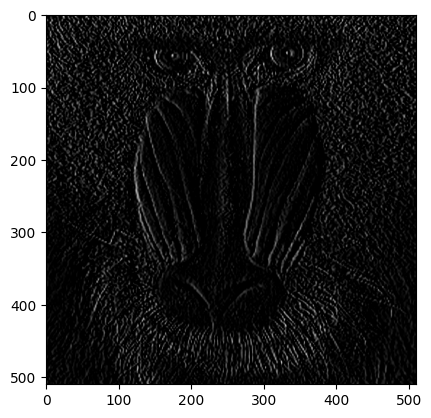

In [614]:
bmask = prewitt_ve < 0
prewitt_ve[bmask] = 0 
plt.imshow(prewitt_ve, cmap = 'gray')

Normalizing looks better

Text(0.5, 1.0, 'Horizontal Edges with Prewitt')

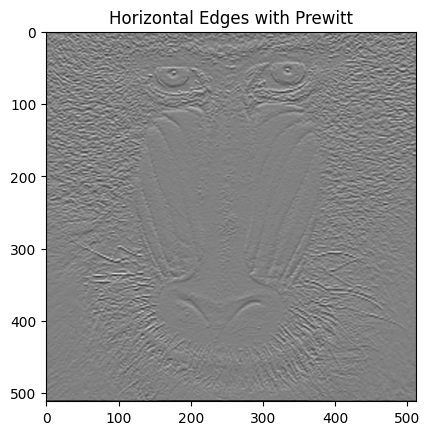

In [616]:
kernel = np.array([[-1,-1,-1],[0,0,0],[1,1,1]])
prewitt_he = convolve2D(pepp, kernel, paddx = 1, paddy = 1, stride = 1)
plt.imshow(prewitt_he, cmap = 'gray')
plt.title("Horizontal Edges with Prewitt")

#### Sobel

Text(0.5, 1.0, 'Vertical edges with sobel')

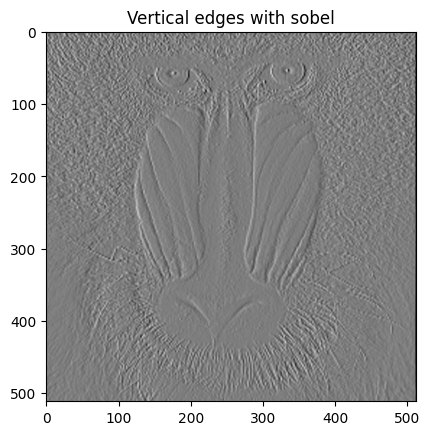

In [619]:
kernel = np.array([[-1,0,1],[-2,0,2],[-1,0,1]])
sobel_ve = convolve2D(pepp, kernel, paddx = 1, paddy = 1, stride = 1)
plt.imshow(sobel_ve, cmap = 'gray')
plt.title("Vertical edges with sobel")

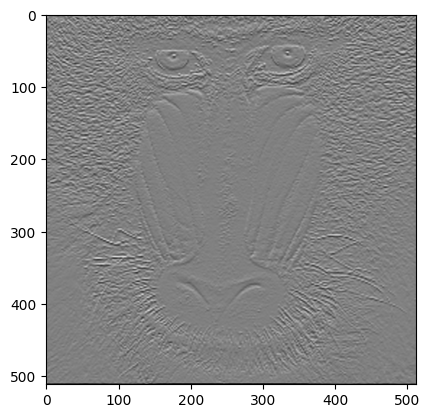

In [620]:
kernel = np.array([[-1,-2,-1],[0,0,0],[1,2,1]]) 
sobel_he = convolve2D(pepp, kernel,paddx = 1, paddy = 1, stride = 1)

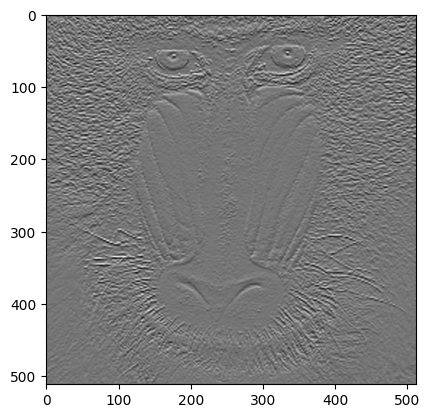

In [621]:
sobel_cv2 = cv2.Sobel(pepp,ddepth = cv2.CV_64F,dx=0,dy=1,ksize = 3)
plt.imshow(sobel_cv2, cmap = 'gray')